In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import ttest_1samp
import warnings

warnings.filterwarnings("ignore")

# Plot style
sns.set_palette("husl")
plt.rcParams["figure.figsize"] = (14,6)
plt.rcParams["font.size"] = 11

In [2]:
# =========================
# LOAD DATASET
# =========================

file_path = "/home/achyutananda-sahoo/Desktop/IIITH-BRSM-MST/01_Preprocessing/compiled_preprocessed.csv"

df = pd.read_csv(file_path)

print("Dataset shape:", df.shape)
print("\nColumns:")
print(df.columns)

print("\nFirst few rows:")
print(df.head())

Dataset shape: (24000, 9)

Columns:
Index(['participant_id', 'condition', 'participant_uid', 'image_path',
       'trial_type', 'user_response', 'boundary_position', 'RT',
       'encoding_RT'],
      dtype='str')

First few rows:
   participant_id  condition  participant_uid        image_path trial_type  \
0               1  item_only  item_only_00001   Scenes\006a.jpg     Target   
1               1  item_only  item_only_00001  Objects\061a.jpg     Target   
2               1  item_only  item_only_00001    Foils\081a.jpg       Foil   
3               1  item_only  item_only_00001  Objects\039b.jpg       Lure   
4               1  item_only  item_only_00001  Objects\033a.jpg     Target   

  user_response boundary_position        RT  encoding_RT  
0        Target               Mid  5.775330     6.531768  
1        Target              Post  2.143779     1.870526  
2          Lure               NaN  2.961038          NaN  
3          Lure               Pre  2.212653     1.522715  
4    

In [3]:
# =========================
# DEFINE ORDER OF BOUNDARY POSITIONS
# =========================

df["boundary_position"] = pd.Categorical(
    df["boundary_position"],
    categories=["Pre", "Mid", "Post"],
    ordered=True
)

In [4]:
# =========================
# HELPER FUNCTION
# =========================

def probability_of_response(data, trial_type, response, boundary=None):
    """
    Computes probability of giving a specific response
    for a given trial type.

    Example:
    P(Target | Foil)
    """

    # Filter rows with specific trial type
    subset = data[data["trial_type"] == trial_type]
    print(subset)

    # Optional filtering by boundary position
    if boundary is not None:
        subset = subset[subset["boundary_position"] == boundary]

    # If no data available
    if subset.empty:
        return np.nan

    # Compute probability
    prob = (subset["user_response"] == response).mean()

    return prob

## REC Analysis

In [5]:
# =========================
# CALCULATE REC SCORE
# =========================

rows = []

# Group data by participant and condition
for (participant, condition), subset in df.groupby(["participant_id", "condition"]):

    # False alarm rate
    foil_old = probability_of_response(subset, "Foil", "Target")

    # Compute REC for each boundary
    for boundary in ["Pre", "Mid", "Post"]:

        hit_rate = probability_of_response(
            subset,
            trial_type="Target",
            response="Target",
            boundary=boundary
        )

        rec = hit_rate - foil_old

        rows.append({
            "participant_id": participant,
            "condition": condition,
            "boundary_position": boundary,
            "REC": rec
        })

rec_df = pd.DataFrame(rows)

     participant_id  condition  participant_uid          image_path  \
2                 1  item_only  item_only_00001      Foils\081a.jpg   
11                1  item_only  item_only_00001   Foils\scenes7.jpg   
13                1  item_only  item_only_00001      Foils\066a.jpg   
16                1  item_only  item_only_00001      Foils\034a.jpg   
17                1  item_only  item_only_00001  Foils\scenes20.jpg   
18                1  item_only  item_only_00001      Foils\010a.jpg   
19                1  item_only  item_only_00001  Foils\scenes15.jpg   
27                1  item_only  item_only_00001  Foils\scenes28.jpg   
28                1  item_only  item_only_00001      Foils\090a.jpg   
29                1  item_only  item_only_00001  Foils\scenes25.jpg   
34                1  item_only  item_only_00001  Foils\scenes14.jpg   
39                1  item_only  item_only_00001      Foils\097a.jpg   
40                1  item_only  item_only_00001  Foils\scenes13.jpg   
41    

In [6]:
rec_df.head()

,participant_id,condition,boundary_position,REC
0,1,item_only,Pre,0.533333
1,1,item_only,Mid,0.633333
2,1,item_only,Post,0.683333
3,2,item_only,Pre,0.516667
4,2,item_only,Mid,0.616667


In [7]:
# =========================
# OVERALL ACCURACY BY CONDITION
# =========================

summary = []

conditions = sorted(df["condition"].unique())

for cond in conditions:

    subset = df[df["condition"] == cond]

    total_trials = len(subset)

    correct_trials = (
        subset["user_response"] == subset["trial_type"]
    ).sum()

    accuracy = correct_trials / total_trials

    summary.append({
        "Condition": cond,
        "Total Trials": total_trials,
        "Correct": correct_trials,
        "Accuracy": accuracy
    })

summary_df = pd.DataFrame(summary)

print(summary_df)

        Condition  Total Trials  Correct  Accuracy
0  Both_item_task          7650     4562  0.596340
1       item_only          8400     5260  0.626190
2       task_only          7950     5053  0.635597


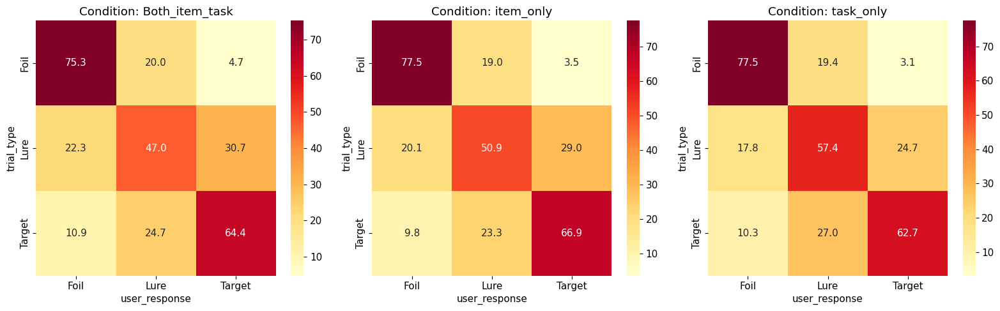

In [8]:
# =========================
# CONFUSION MATRIX
# =========================

conditions = sorted(df["condition"].unique())

fig, axes = plt.subplots(1, len(conditions), figsize=(16,5))

for i, cond in enumerate(conditions):

    subset = df[df["condition"] == cond]

    confusion = pd.crosstab(
        subset["trial_type"],
        subset["user_response"],
        normalize="index"
    ) * 100

    sns.heatmap(
        confusion,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        ax=axes[i]
    )

    axes[i].set_title(f"Condition: {cond}")

plt.tight_layout()
plt.show()

## REC Distribution Aanlysis

In [9]:
# REC distribution per condition(item_only, both, task_only) and per position (mid,pre,post)

def plot_rec_distribution(rec_df, condition, position):
    
    """
    Plot the REC distribution for a given condition and boundary position.
    
    Parameters:
    rec_df : DataFrame containing REC scores
    condition : string (e.g., 'item_only', 'task_only', 'both_item_task')
    position : string (e.g., 'Pre', 'Mid', 'Post')
    """
    
    # Filter the data
    subset = rec_df[
        (rec_df["condition"] == condition) &
        (rec_df["boundary_position"] == position)
    ]
    
    if subset.empty:
        print("No data found for this condition and position.")
        return
    
    # Plot distribution
    plt.figure(figsize=(8,5))
    
    sns.histplot(
        subset["REC"],
        bins=15,
        kde=True
    )
    
    plt.title(f"REC Distribution\nCondition: {condition} | Boundary: {position}")
    plt.xlabel("REC Score")
    plt.ylabel("Frequency")
    
    plt.show()

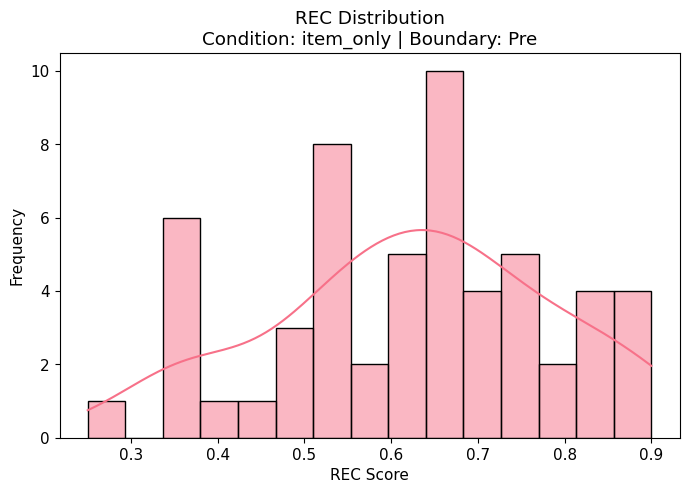

In [10]:
plot_rec_distribution(rec_df, "item_only", "Pre")

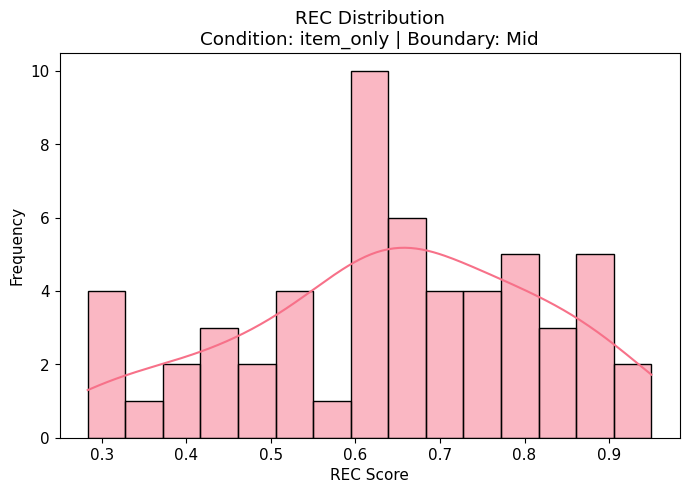

In [11]:
plot_rec_distribution(rec_df, "item_only", "Mid")

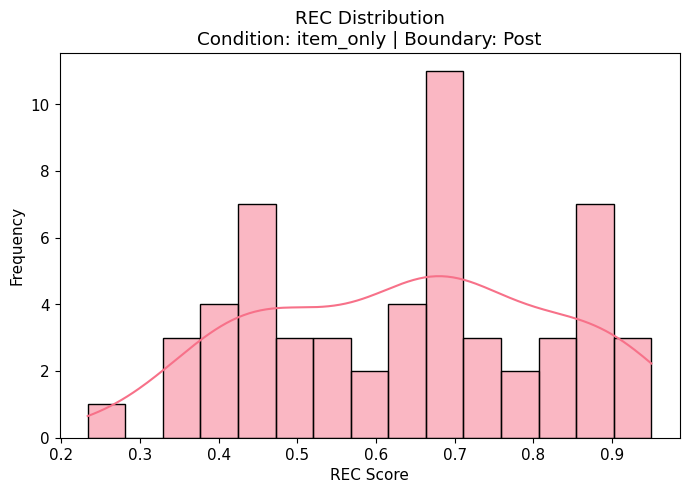

In [12]:
plot_rec_distribution(rec_df, "item_only", "Post")

In [13]:
def plot_rec_distribution_by_condition(rec_df, condition):
    
    """
    Plot REC distributions for Pre, Mid, and Post positions
    for a given condition.
    
    Parameters
    ----------
    rec_df : DataFrame
        DataFrame containing REC values
    condition : str
        Condition name (e.g., 'item_only', 'task_only', 'both_item_task')
    """
    
    # Filter dataset for selected condition
    subset = rec_df[rec_df["condition"] == condition]
    
    positions = ["Pre", "Mid", "Post"]
    
    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    
    for i, pos in enumerate(positions):
        
        pos_data = subset[subset["boundary_position"] == pos]
        
        sns.histplot(
            pos_data["REC"],
            bins=15,
            kde=True,
            ax=axes[i]
        )
        
        axes[i].set_title(f"{pos} Boundary")
        axes[i].set_xlabel("REC Score")
        axes[i].set_ylabel("Frequency")
    
    fig.suptitle(f"REC Distribution Across Boundary Positions\nCondition: {condition}", fontsize=14)
    
    plt.tight_layout()
    plt.show()

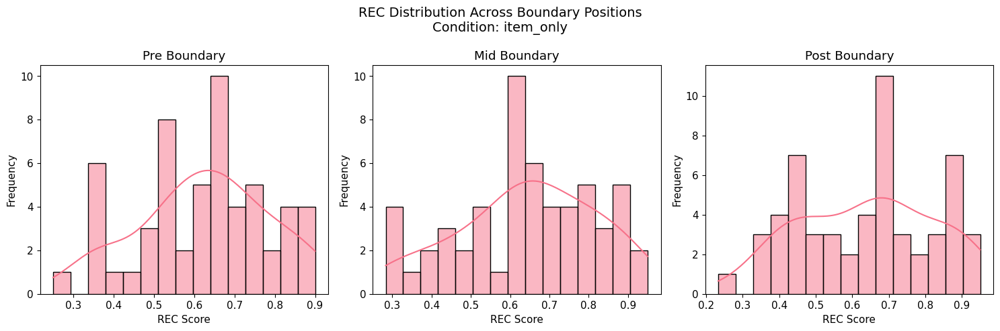

In [14]:
plot_rec_distribution_by_condition(rec_df, "item_only")

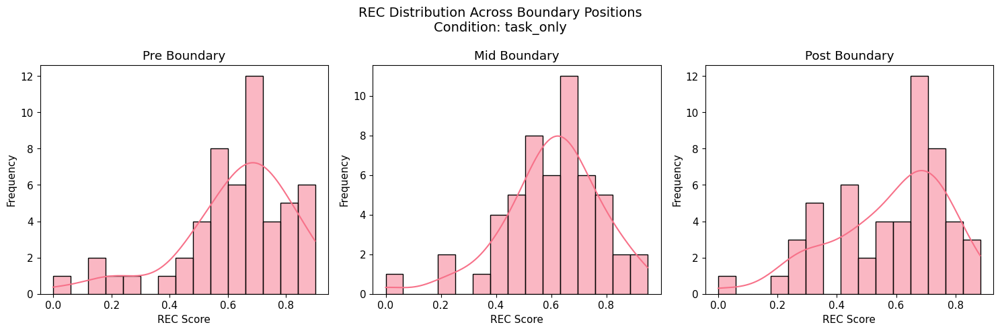

In [15]:
plot_rec_distribution_by_condition(rec_df, "task_only")

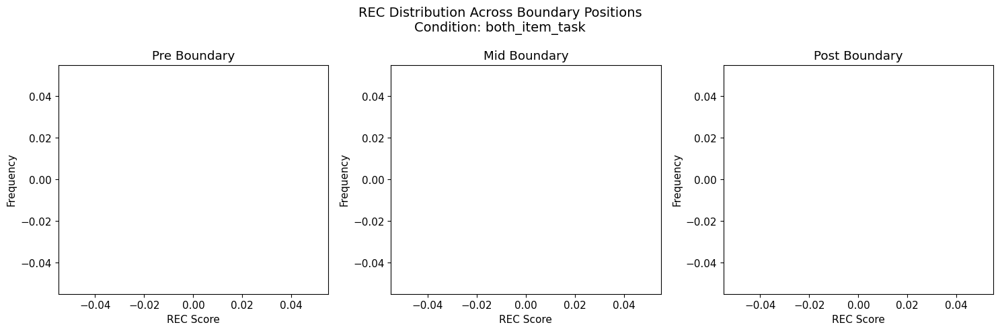

In [16]:
plot_rec_distribution_by_condition(rec_df, "both_item_task")

## LDI Analysis

In [17]:
# =========================
# CALCULATE LDI SCORE
# =========================

rows = []

# Group data by participant and condition
for (participant, condition), subset in df.groupby(["participant_id", "condition"]):

    # False lure rate
    foil_lure = probability_of_response(subset, "Foil", "Lure")

    # Compute LDI for each boundary
    for boundary in ["Pre", "Mid", "Post"]:

        lure_correct = probability_of_response(
            subset,
            trial_type="Lure",
            response="Lure",
            boundary=boundary
        )

        ldi = lure_correct - foil_lure

        rows.append({
            "participant_id": participant,
            "condition": condition,
            "boundary_position": boundary,
            "LDI": ldi
        })

ldi_df = pd.DataFrame(rows)

     participant_id  condition  participant_uid          image_path  \
2                 1  item_only  item_only_00001      Foils\081a.jpg   
11                1  item_only  item_only_00001   Foils\scenes7.jpg   
13                1  item_only  item_only_00001      Foils\066a.jpg   
16                1  item_only  item_only_00001      Foils\034a.jpg   
17                1  item_only  item_only_00001  Foils\scenes20.jpg   
18                1  item_only  item_only_00001      Foils\010a.jpg   
19                1  item_only  item_only_00001  Foils\scenes15.jpg   
27                1  item_only  item_only_00001  Foils\scenes28.jpg   
28                1  item_only  item_only_00001      Foils\090a.jpg   
29                1  item_only  item_only_00001  Foils\scenes25.jpg   
34                1  item_only  item_only_00001  Foils\scenes14.jpg   
39                1  item_only  item_only_00001      Foils\097a.jpg   
40                1  item_only  item_only_00001  Foils\scenes13.jpg   
41    

     participant_id  condition  participant_uid        image_path trial_type  \
300               3  item_only  item_only_00003  Objects\187b.jpg       Lure   
302               3  item_only  item_only_00003  Objects\140b.jpg       Lure   
304               3  item_only  item_only_00003  Objects\006b.jpg       Lure   
310               3  item_only  item_only_00003   Scenes\088b.jpg       Lure   
315               3  item_only  item_only_00003  Objects\189b.jpg       Lure   
316               3  item_only  item_only_00003  Objects\008b.jpg       Lure   
319               3  item_only  item_only_00003   Scenes\161b.jpg       Lure   
326               3  item_only  item_only_00003  Objects\107b.jpg       Lure   
327               3  item_only  item_only_00003   Scenes\071b.jpg       Lure   
329               3  item_only  item_only_00003  Objects\068b.jpg       Lure   
332               3  item_only  item_only_00003  Objects\045b.jpg       Lure   
333               3  item_only  item_onl

In [18]:
def plot_ldi_distribution_by_condition(ldi_df, condition):
    
    """
    Plot LDI distributions for Pre, Mid, and Post boundary positions
    for a given condition.
    
    Parameters
    ----------
    ldi_df : DataFrame
        DataFrame containing LDI scores
    condition : str
        Condition name (e.g., 'item_only', 'task_only', 'both_item_task')
    """

    # Filter dataframe for the selected condition
    subset = ldi_df[ldi_df["condition"] == condition]

    positions = ["Pre", "Mid", "Post"]

    fig, axes = plt.subplots(1, 3, figsize=(15,5))

    for i, pos in enumerate(positions):

        pos_data = subset[subset["boundary_position"] == pos]

        sns.histplot(
            pos_data["LDI"],
            bins=15,
            kde=True,
            ax=axes[i]
        )

        # Mean line
        mean_val = pos_data["LDI"].mean()
        axes[i].axvline(mean_val, color="red", linestyle="--")

        axes[i].set_title(f"{pos} Boundary")
        axes[i].set_xlabel("LDI Score")
        axes[i].set_ylabel("Frequency")

    fig.suptitle(f"LDI Distribution Across Boundary Positions\nCondition: {condition}", fontsize=14)

    plt.tight_layout()
    plt.show()

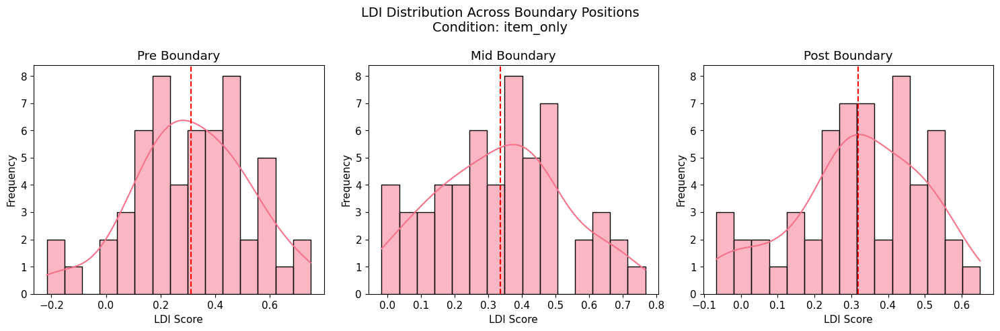

In [19]:
plot_ldi_distribution_by_condition(ldi_df, "item_only")

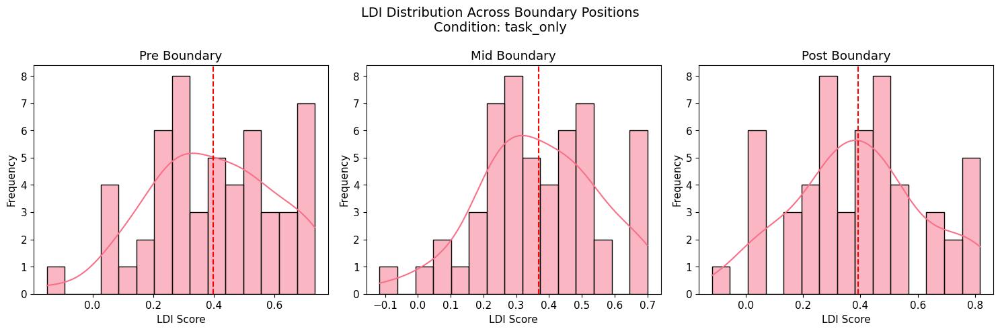

In [20]:
plot_ldi_distribution_by_condition(ldi_df, "task_only")

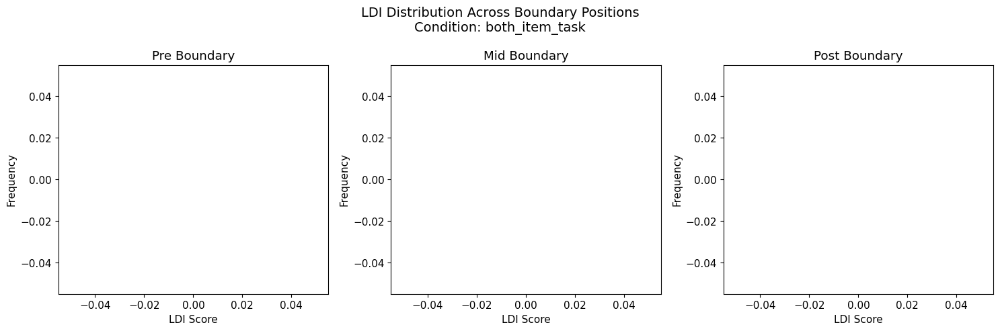

In [21]:
plot_ldi_distribution_by_condition(ldi_df, "both_item_task")

# Shapiro–Wilk Test for Normality

The **Shapiro–Wilk test** is a statistical test used to determine whether a dataset comes from a **normally distributed population**.

Normality testing is important because many statistical methods (like **t-tests, ANOVA, and regression assumptions**) require that the data follows a **normal distribution**.

---

# 1. What is a Normal Distribution?

A **normal distribution** is a symmetric bell-shaped distribution where:

- The **mean**, **median**, and **mode** are equal.
- Most values lie near the center.
- The probability decreases symmetrically as we move away from the mean.

Properties:

- 68% of data lies within **1 standard deviation**
- 95% within **2 standard deviations**
- 99.7% within **3 standard deviations**

Many natural and experimental measurements approximately follow this distribution.

---

# 2. Why Do We Test for Normality?

Many statistical tests assume that the data is normally distributed.

Examples:

- **t-test**
- **ANOVA**
- **Linear regression residual assumptions**

If data is **not normal**, these tests may produce incorrect conclusions.

In such cases, researchers often use **non-parametric tests** instead.

Example:

| Parametric Test | Non-Parametric Alternative |
|----------------|---------------------------|
| t-test | Wilcoxon test |
| ANOVA | Kruskal–Wallis test |

---

# 3. What Does the Shapiro–Wilk Test Do?

The Shapiro–Wilk test evaluates whether a sample of data is **consistent with a normal distribution**.

It does this by comparing:

- the **actual order of sample values**
- with the **expected order if the data were perfectly normal**

If the sample closely matches what we would expect from a normal distribution, the test statistic will indicate normality.

---

# 4. Hypotheses of the Test

The Shapiro–Wilk test uses the following hypotheses:

**Null Hypothesis (H₀):**  
The data follows a **normal distribution**.

**Alternative Hypothesis (H₁):**  
The data **does not follow** a normal distribution.

---

# 5. Test Statistic

The Shapiro–Wilk statistic is denoted by **W**.

The formula is:

$$W = \frac{(\sum_{i=1}^{n} a_i x_{(i)})^2}{\sum_{i=1}^{n} (x_i - \bar{x})^2}$$

Where:

- \( x_{(i)} \) = ordered sample values
- \( \bar{x} \) = sample mean
- \( a_i \) = constants derived from expected normal order statistics
- \( n \) = sample size

Interpretation:

- **W close to 1 → data is likely normal**
- **W much smaller than 1 → data deviates from normality**

The constants \(a_i\) are computed from properties of the **expected values of order statistics from a normal distribution**.

---

# 6. P-Value Interpretation

After computing the statistic \(W\), the test produces a **p-value**.

Decision rule:

| p-value | Interpretation |
|-------|---------------|
| p > 0.05 | Data is likely normal (fail to reject H₀) |
| p ≤ 0.05 | Data is not normal (reject H₀) |

In [22]:
from scipy.stats import shapiro


def test_normality_by_position(data, metric, condition, alpha=0.05):
    """
    Test normality (Shapiro-Wilk) for each boundary position
    and visualize results as a table image.

    Parameters
    ----------
    data : DataFrame
    metric : str ("REC" or "LDI")
    condition : str
    alpha : float
        Significance threshold (default=0.05)
    """

    subset = data[data["condition"] == condition]
    positions = ["Pre", "Mid", "Post"]

    results = []

    for pos in positions:
        pos_data = subset[subset["boundary_position"] == pos][metric].dropna()

        if len(pos_data) < 3:
            stat, p_value = np.nan, np.nan
            interpretation = "Insufficient sample (n < 3)"
        else:
            stat, p_value = shapiro(pos_data)
            interpretation = (
                "Distribution looks NORMAL"
                if p_value > alpha
                else "Distribution is NOT normal"
            )

        results.append(
            {
                "Boundary Position": pos,
                "N": len(pos_data),
                "Shapiro W": stat,
                "P-value": p_value,
                "Result": interpretation,
            }
        )

    results_df = pd.DataFrame(results)

    # -------- Table Image --------
    table_df = results_df.copy()
    table_df["Shapiro W"] = table_df["Shapiro W"].map(
        lambda x: "-" if pd.isna(x) else f"{x:.4f}"
    )
    table_df["P-value"] = table_df["P-value"].map(
        lambda x: "-" if pd.isna(x) else f"{x:.4f}"
    )

    fig_height = 1.5 + 0.55 * len(table_df)
    fig, ax = plt.subplots(figsize=(11, fig_height))
    ax.axis("off")

    table = ax.table(
        cellText=table_df.values,
        colLabels=table_df.columns,
        cellLoc="center",
        loc="center",
    )

    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.4)

    # Header styling
    for col in range(len(table_df.columns)):
        table[(0, col)].set_facecolor("#D9EAF7")
        table[(0, col)].set_text_props(weight="bold")

    plt.title(
        f"Shapiro-Wilk Normality Test | {metric} | Condition: {condition}",
        fontsize=12,
        pad=12,
    )
    plt.tight_layout()
    plt.show()

    return results_df

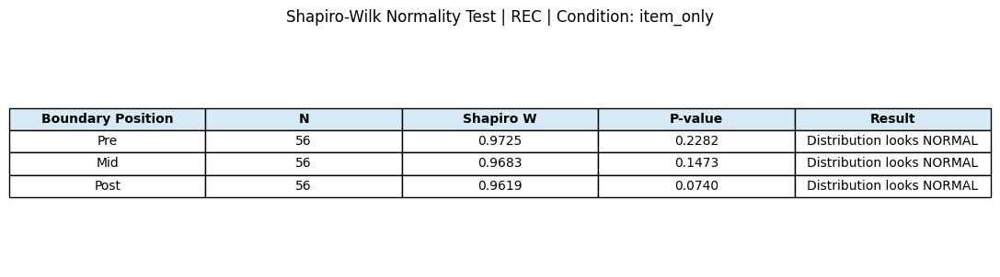

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,56,0.972499,0.228169,Distribution looks NORMAL
1,Mid,56,0.968327,0.147298,Distribution looks NORMAL
2,Post,56,0.961867,0.074007,Distribution looks NORMAL


In [23]:
test_normality_by_position(rec_df, "REC", "item_only")

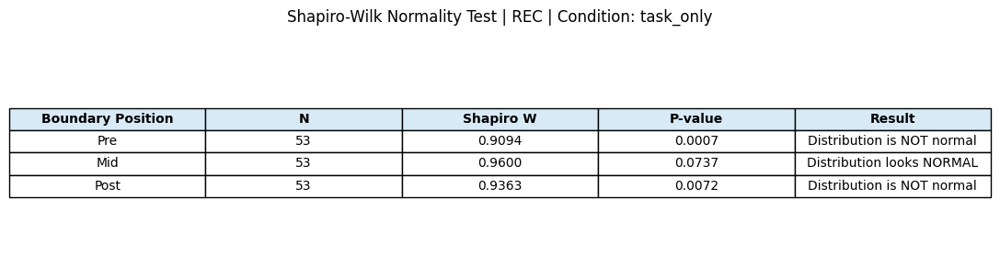

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,53,0.909389,0.000686,Distribution is NOT normal
1,Mid,53,0.960040,0.073731,Distribution looks NORMAL
2,Post,53,0.936278,0.007199,Distribution is NOT normal


In [24]:
test_normality_by_position(rec_df, "REC", "task_only")

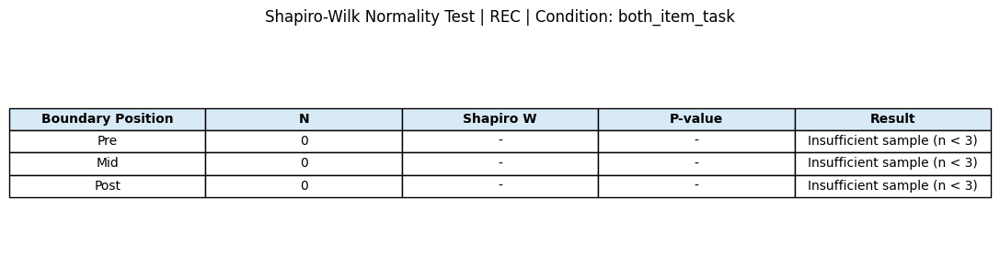

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,0,NaN,NaN,Insufficient sample (n < 3)
1,Mid,0,NaN,NaN,Insufficient sample (n < 3)
2,Post,0,NaN,NaN,Insufficient sample (n < 3)


In [25]:
test_normality_by_position(rec_df, "REC", "both_item_task")

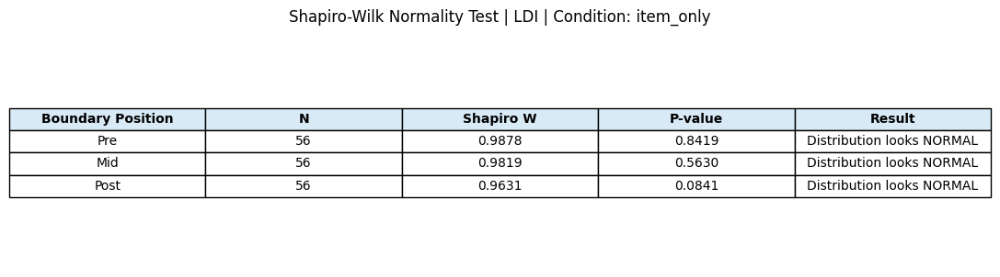

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,56,0.987812,0.841888,Distribution looks NORMAL
1,Mid,56,0.981946,0.563022,Distribution looks NORMAL
2,Post,56,0.963066,0.084103,Distribution looks NORMAL


In [26]:
test_normality_by_position(ldi_df, "LDI", "item_only")

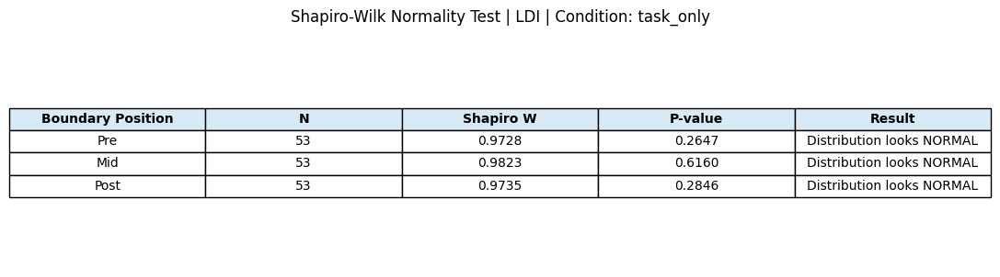

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,53,0.972756,0.264718,Distribution looks NORMAL
1,Mid,53,0.982309,0.616041,Distribution looks NORMAL
2,Post,53,0.973506,0.284627,Distribution looks NORMAL


In [27]:
test_normality_by_position(ldi_df, "LDI", "task_only")

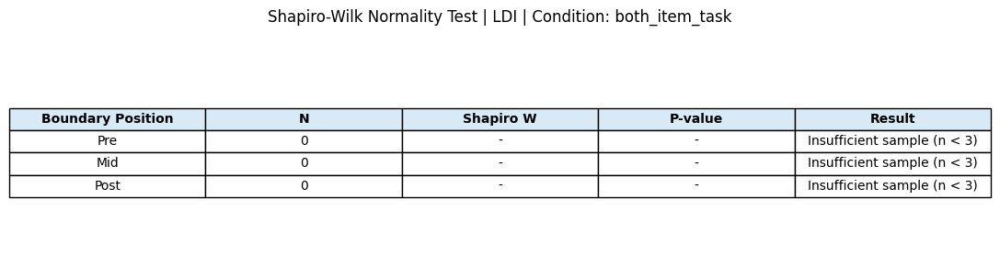

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,0,NaN,NaN,Insufficient sample (n < 3)
1,Mid,0,NaN,NaN,Insufficient sample (n < 3)
2,Post,0,NaN,NaN,Insufficient sample (n < 3)


In [28]:
test_normality_by_position(ldi_df, "LDI", "both_item_task")

# Mean REC/LDI Summary table

In [29]:
rec_df.groupby(["condition","boundary_position"])["REC"].agg(["mean","std","count"])

mean       std  count
condition      boundary_position                           
Both_item_task Mid                0.627451  0.171167     51
               Post               0.553922  0.162022     51
               Pre                0.609804  0.151334     51
item_only      Mid                0.643561  0.175113     56
               Post               0.640179  0.184111     56
               Pre                0.623363  0.160747     56
task_only      Mid                0.603136  0.179642     53
               Post               0.579200  0.193539     53
               Pre                0.630346  0.195851     53

In [30]:
ldi_df.groupby(["condition","boundary_position"])["LDI"].agg(["mean","std","count"])

mean       std  count
condition      boundary_position                           
Both_item_task Mid                0.289216  0.218551     51
               Post               0.254902  0.184641     51
               Pre                0.266667  0.185652     51
item_only      Mid                0.336432  0.193060     56
               Post               0.319048  0.175908     56
               Pre                0.312798  0.211941     56
task_only      Mid                0.368396  0.180686     53
               Post               0.392977  0.227468     53
               Pre                0.397170  0.206718     53

# Condition Comparison 

<Axes: xlabel='condition', ylabel='REC'>

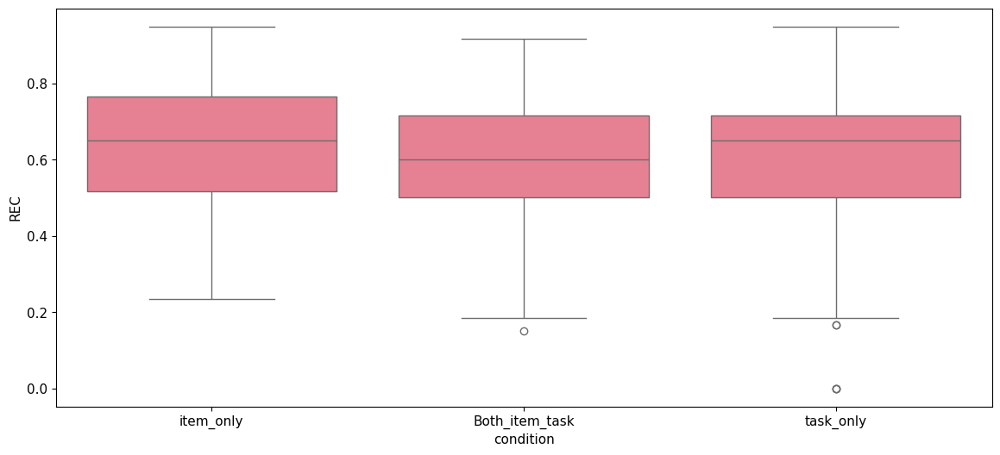

In [31]:
sns.boxplot(
    data=rec_df,
    x="condition",
    y="REC"
)

<Axes: xlabel='condition', ylabel='LDI'>

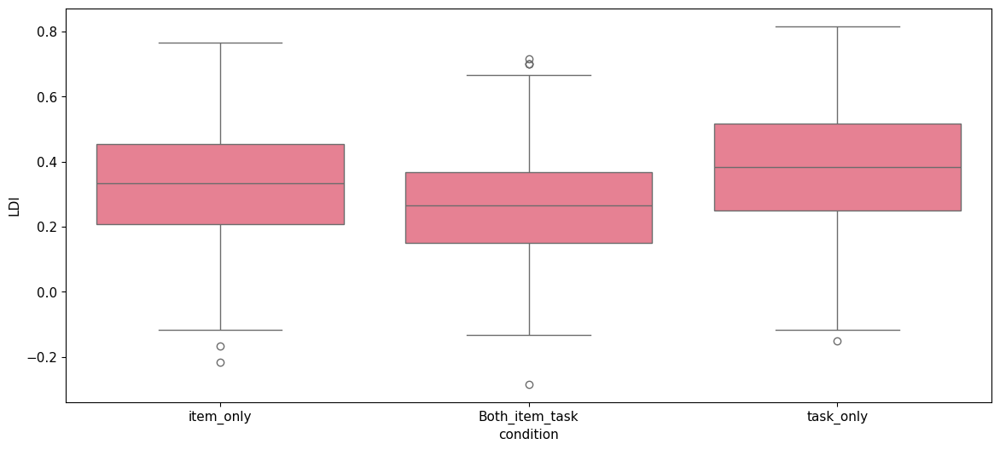

In [32]:
sns.boxplot(
    data=ldi_df,
    x="condition",
    y="LDI"
)

# Combined Visualization

<Axes: xlabel='boundary_position', ylabel='REC'>

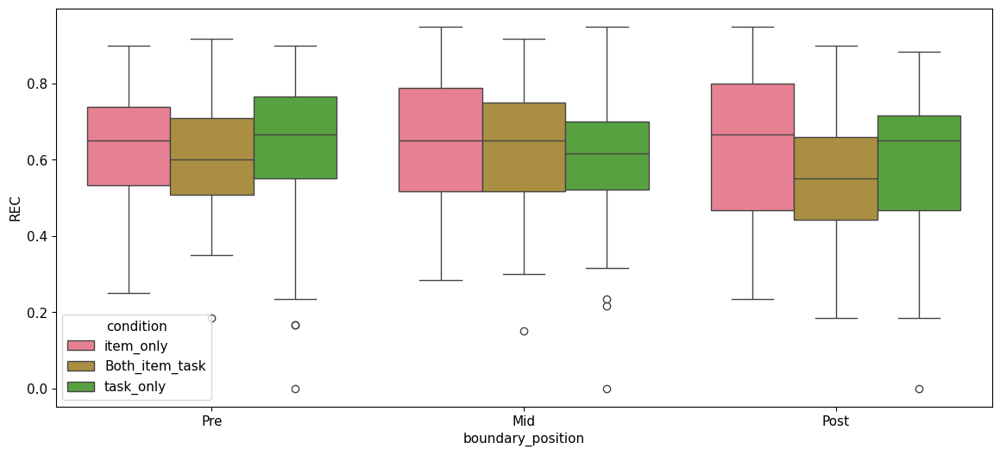

In [33]:
sns.boxplot(
    data=rec_df,
    x="boundary_position",
    y="REC",
    hue="condition"
)

<Axes: xlabel='REC', ylabel='Density'>

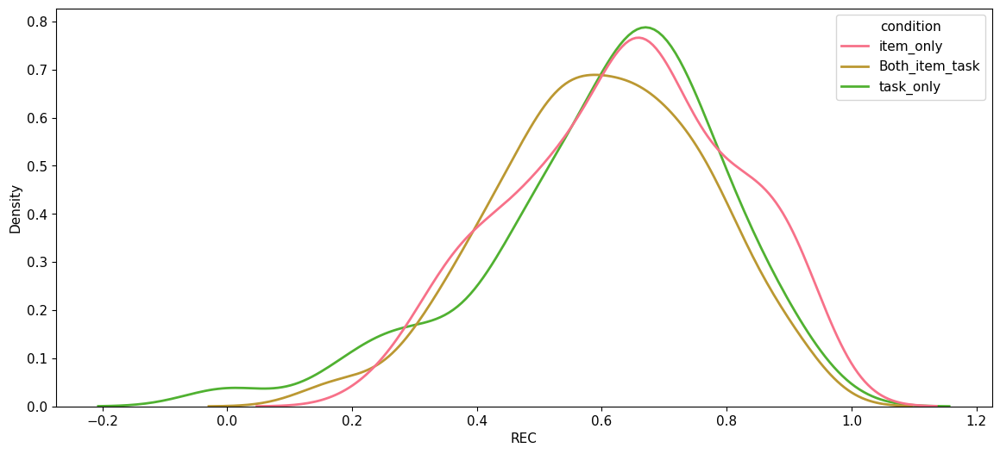

In [34]:
sns.kdeplot(
    data=rec_df,
    x="REC",
    hue="condition",
    linewidth=2  # Makes the lines slightly thicker and easier to read
)

<Axes: xlabel='LDI', ylabel='Density'>

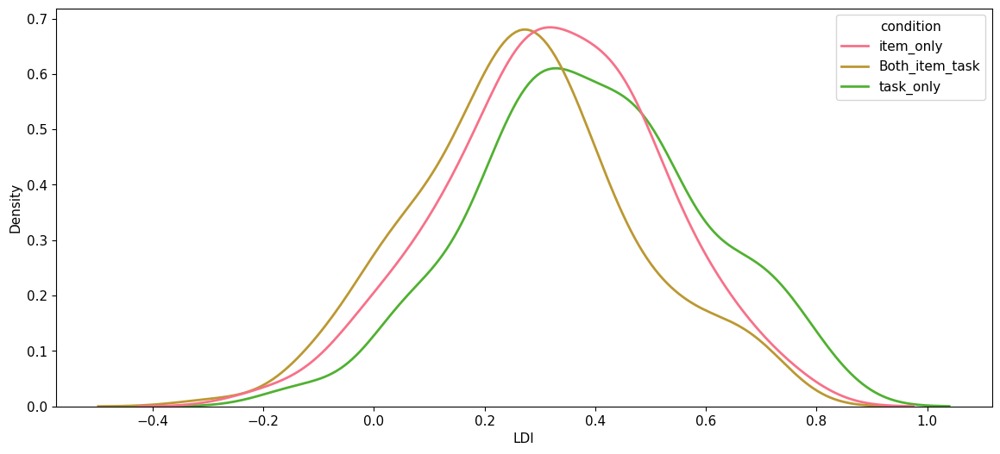

In [35]:
sns.kdeplot(
    data=ldi_df,
    x="LDI",
    hue="condition",
    linewidth=2  # Makes the lines slightly thicker and easier to read
)

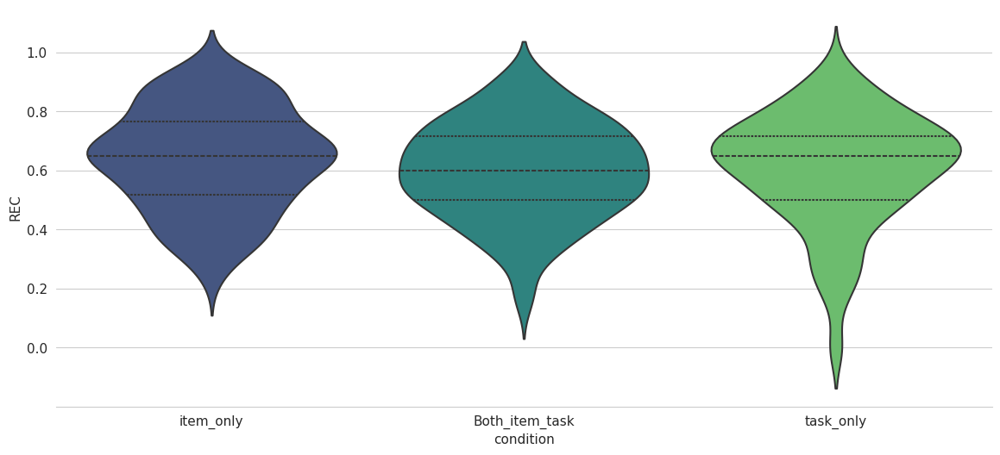

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Set a clean, modern background (removes the gray, adds subtle gridlines)
sns.set_style("whitegrid")

# 2. Create the violin plot with upgraded aesthetics
sns.violinplot(
    data=rec_df,
    x="condition",
    y="REC",
    palette="viridis",        # The "cool" color theme. Try "viridis" or "crest" too!
    linewidth=1.5,         # Gives the violins crisper, thicker outlines
    inner="quartile",      # Replaces the default mini-box with sleek quartile lines
    density_norm="width"   # Ensures all violins scale uniformly, looking much neater
)

# 3. Remove the top and right borders for a minimalist look
sns.despine(left=True)

plt.show()

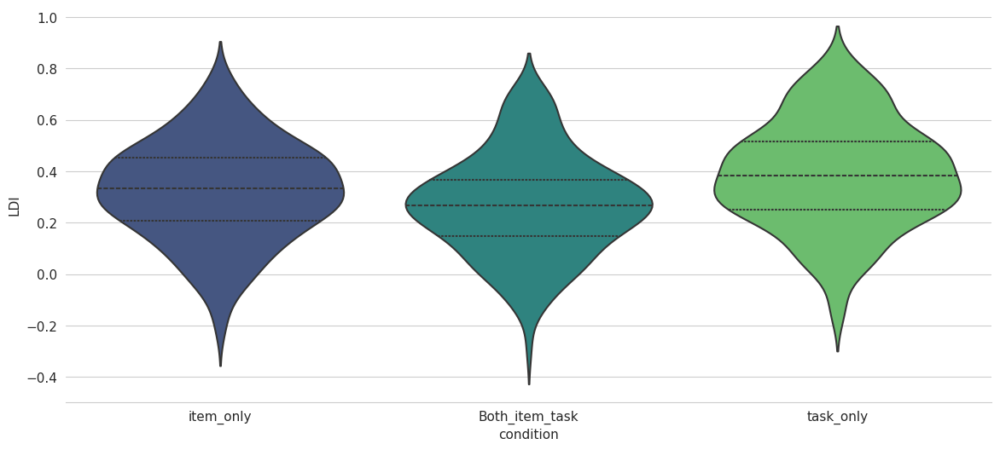

In [37]:
# 1. Set a clean, modern background (removes the gray, adds subtle gridlines)
sns.set_style("whitegrid")

# 2. Create the violin plot with upgraded aesthetics
sns.violinplot(
    data=ldi_df,
    x="condition",
    y="LDI",
    palette="viridis",        # The "cool" color theme. Try "viridis" or "crest" too!
    linewidth=1.5,         # Gives the violins crisper, thicker outlines
    inner="quartile",      # Replaces the default mini-box with sleek quartile lines
    density_norm="width"   # Ensures all violins scale uniformly, looking much neater
)

# 3. Remove the top and right borders for a minimalist look
sns.despine(left=True)

plt.show()

# REC vs LDI Comparison

In [38]:
metrics_df = pd.merge(
    rec_df,
    ldi_df,
    on=["participant_id","condition","boundary_position"]
)

<Axes: xlabel='REC', ylabel='LDI'>

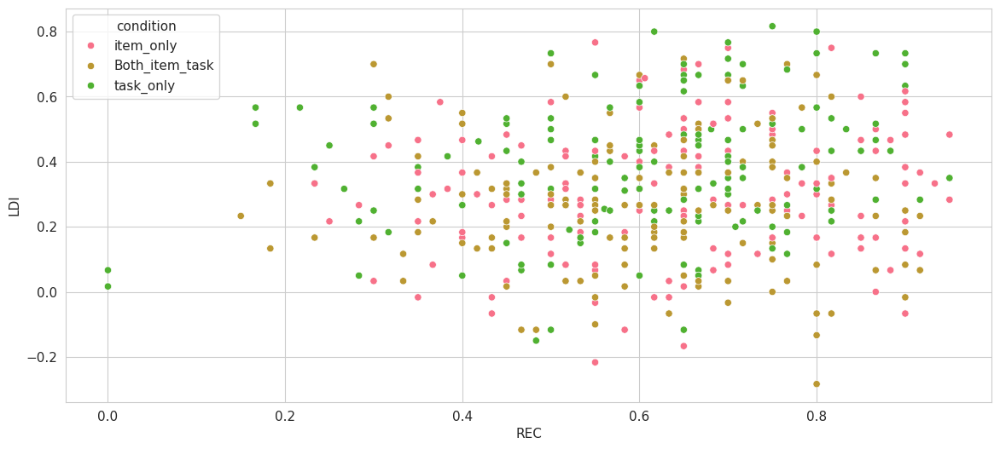

In [39]:
sns.scatterplot(
    data=metrics_df,
    x="REC",
    y="LDI",
    hue="condition"
)

Condition wise comparison

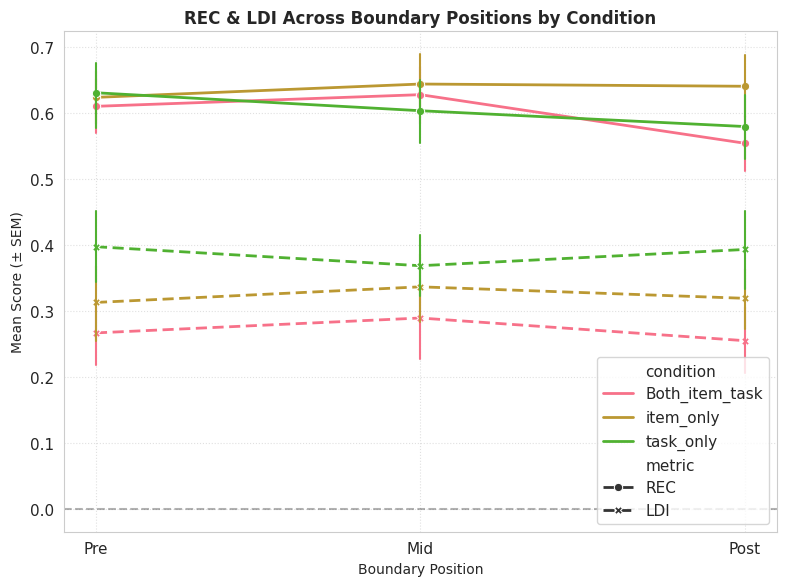

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the dataset
file_path = "../01_Preprocessing/compiled_preprocessed.csv"
df = pd.read_csv(file_path)

df['condition'] = df['condition'].astype(str).str.strip()
df['boundary_position'] = pd.Categorical(df['boundary_position'], 
                                        categories=["Pre", "Mid", "Post"], 
                                        ordered=True)

# 2. Calculate Global False Alarm Rates per Participant
g_records = []
for uid, g in df.groupby("participant_uid"):
    foils = g[g["trial_type"] == "Foil"]
    fa_t  = (foils["user_response"] == "Target").mean() if len(foils) > 0 else 0.0
    fa_l  = (foils["user_response"] == "Lure").mean()   if len(foils) > 0 else 0.0
    g_records.append({"participant_uid": uid, "FA_Target": fa_t, "FA_Lure": fa_l})

global_fa = pd.DataFrame(g_records)

# 3. Calculate REC and LDI per Position
p_records = []
pos_trials = df[df["boundary_position"].isin(["Pre", "Mid", "Post"])]

for (uid, pos), g in pos_trials.groupby(["participant_uid", "boundary_position"]):
    cond     = g["condition"].iloc[0]
    targets  = g[g["trial_type"] == "Target"]
    lures    = g[g["trial_type"] == "Lure"]
    hit_rate = (targets["user_response"] == "Target").mean() if len(targets) > 0 else 0.0
    sim_rate = (lures["user_response"] == "Lure").mean()     if len(lures)   > 0 else 0.0
    fa_row   = global_fa[global_fa["participant_uid"] == uid]
    fa_t     = float(fa_row["FA_Target"].values[0]) if not fa_row.empty else 0.0
    fa_l     = float(fa_row["FA_Lure"].values[0])   if not fa_row.empty else 0.0
    p_records.append({
        "participant_uid": uid,
        "condition": cond,
        "boundary_position": pos,
        "REC": hit_rate - fa_t,
        "LDI": sim_rate - fa_l
    })

plot_df = pd.DataFrame(p_records)

# 4. Melt so REC and LDI are in one column
melted = plot_df.melt(
    id_vars=["participant_uid", "condition", "boundary_position"],
    value_vars=["REC", "LDI"],
    var_name="metric",
    value_name="score"
)

# 5. Single combined plot
plt.figure(figsize=(8, 6))

sns.lineplot(
    data=melted,
    x="boundary_position",
    y="score",
    hue="condition",
    style="metric",
    markers=True,
    dashes={"REC": (1, 0), "LDI": (4, 2)},
    err_style="bars",
    linewidth=2
)

plt.legend(
    title="",
    loc='lower right',
    frameon=True
)

plt.title("REC & LDI Across Boundary Positions by Condition", fontsize=12, fontweight='bold')
plt.xlabel("Boundary Position", fontsize=10)
plt.ylabel("Mean Score (± SEM)", fontsize=10)
plt.axhline(0, color='black', linestyle='--', alpha=0.3)
plt.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()


1. In the item-only condition, a weak positive relationship between REC and LDI was observed, suggesting that recognition memory and lure discrimination abilities are only loosely related.
2. In the both-item-task condition, the relationship between REC and LDI appears minimal, suggesting that recognition performance does not strongly predict lure discrimination ability in this task setting.
3. The task-only condition shows a stronger positive relationship between REC and LDI, indicating that participants who perform well in recognition also tend to exhibit better lure discrimination when the task demands are simplified.